<a href="https://colab.research.google.com/github/arfianaja/Chat/blob/main/70%2C15%2C15_yolov5%2C%20kelvin.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

install requirements

In [1]:
#clone YOLOv5 and
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5
%pip install -qr requirements.txt # install dependencies

import torch
import os
from IPython.display import Image, clear_output  # to display images

print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

Cloning into 'yolov5'...
remote: Enumerating objects: 16114, done.
remote: Counting objects: 100% (25/25), done.
remote: Compressing objects: 100% (24/24), done.
remote: Total 16114 (delta 8), reused 10 (delta 1), pack-reused 16089
Receiving objects: 100% (16114/16114), 14.84 MiB | 16.30 MiB/s, done.
Resolving deltas: 100% (11027/11027), done.
/content/yolov5
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 190.6/190.6 kB 1.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.6/3.6 MB 10.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 661.2/661.2 kB 13.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 3.1 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
imageio 2.31.6 requires pillow<10.1.0,>=8.3.2, but you have pillow 10.1.0 which is incompatible.
Setup complete. Using torch 2.1.0+cu121 (T

In [2]:
!pip install roboflow

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 68.5/68.5 kB 2.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 158.3/158.3 kB 12.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.7/178.7 kB 26.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 7.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.1/49.1 MB 16.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.8/67.8 kB 10.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 77.5/77.5 kB 12.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 8.8 MB/s eta 0:00:00
  Attempting uninstall: pyparsing
    Found existing installation: pyparsing 3.1.1
    Uninstalling pyparsing-3.1.1:
      Successfully uninstalled pyparsing-3.1.1
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.8.1.78
    Uninstalling opencv-python-headless-4.8.1.78:
      Successfully uninst

In [3]:
#follow the link below to get your download code from from Roboflow
!pip install -q roboflow
from roboflow import Roboflow
rf = Roboflow(api_key="ghYerxhpNPg3ujf6nhGy", model_format="yolov5", notebook="roboflow-yolov5")

In [4]:
# set up environment
os.environ["DATASET_DIRECTORY"] = "/content/datasets"

masukkan kode dari roboflow


In [5]:
%cd /content/yolov5
#after following the link above, recieve python code with these fields filled in
#from roboflow import Roboflow
from roboflow import Roboflow
rf = Roboflow(api_key="ghYerxhpNPg3ujf6nhGy")
project = rf.workspace("luca-vziny").project("people-4evn7")
dataset = project.version(1).download("yolov5")

/content/yolov5
loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to /content/datasets/People-1 in yolov5pytorch:: 100%|██████████| 3386/3386 [00:00<00:00, 6011.20it/s]


Train Our Custom YOLOv5 model
Here, we are able to pass a number of arguments:

img: menentukan ukuran gambar masukan

batch: menentukan ukuran batch

epochs: menentukan jumlah periode pelatihan. (Catatan: sering kali, 3000+ adalah umum di sini!)

data: Lokasi dataset kami disimpan di dataset.location

weights: tentukan jalur ke bobot untuk memulai transfer pembelajaran. Di sini kami memilih pos pemeriksaan pretrained COCO umum.

cache: gambar cache untuk pelatihan lebih cepat

In [6]:
!python train.py --img 416 --batch 32 --epochs 200 --data {dataset.location}/data.yaml --weights yolov5s.pt --cache --name yolov5s_results

2023-12-21 19:03:57.942500: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2023-12-21 19:03:57.942553: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2023-12-21 19:03:57.944492: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
train: weights=yolov5s.pt, cfg=, data=/content/datasets/People-1/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=200, batch_size=32, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=Fals

** Evaluasi Performa Detektor YOLOv5 Khusus Kerugian pelatihan dan metrik kinerja disimpan ke Tensorboard dan juga ke file log.**

**If you are new to these metrics, the one you want to focus on is mAP_0.5 - learn more about mean average precision here.**


In [7]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs
%reload_ext tensorboard

<IPython.core.display.Javascript object>

In [8]:
!python detect.py --weights runs/train/yolov5s_results/weights/best.pt --img 416 --conf 0.1 --source {dataset.location}/test/images

detect: weights=['runs/train/yolov5s_results/weights/best.pt'], source=/content/datasets/People-1/test/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-253-g63555c8 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
image 1/14 /content/datasets/People-1/test/images/clip_main_lobby_Tan_mp4-102_jpg.rf.719290b2cbb8b942369407b8aa61f3fa.jpg: 416x416 2 Peoples, 6.9ms
image 2/14 /content/datasets/People-1/test/images/clip_main_lobby_Tan_mp4-104_jpg.rf.b3526428898caf553a645c463f2ab066.jpg: 416x416 3 Peoples, 7.0ms
imag

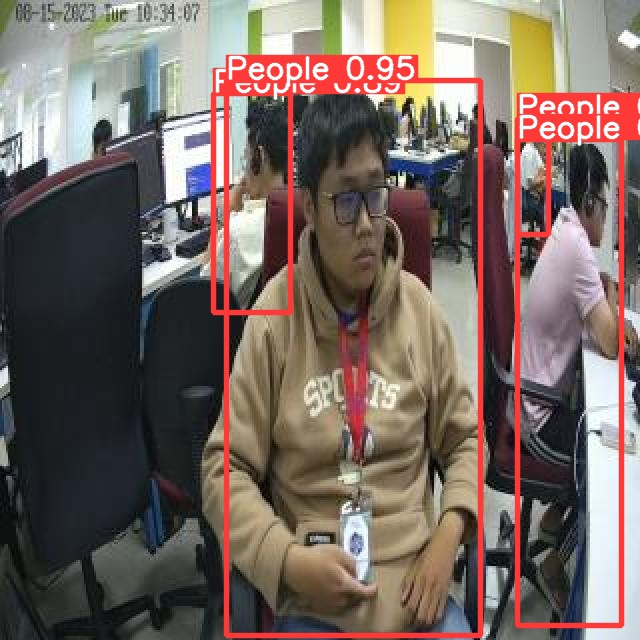

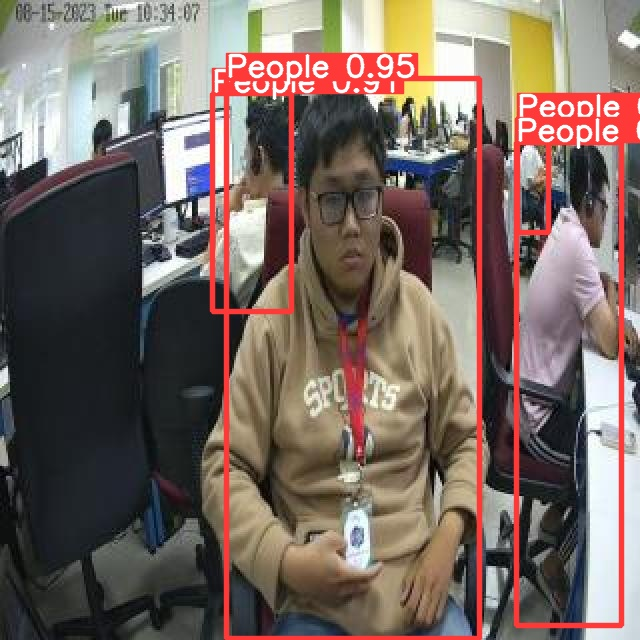

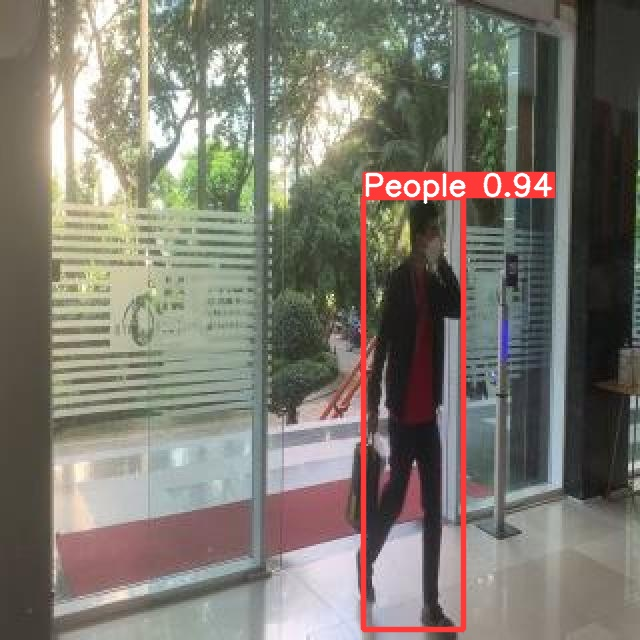

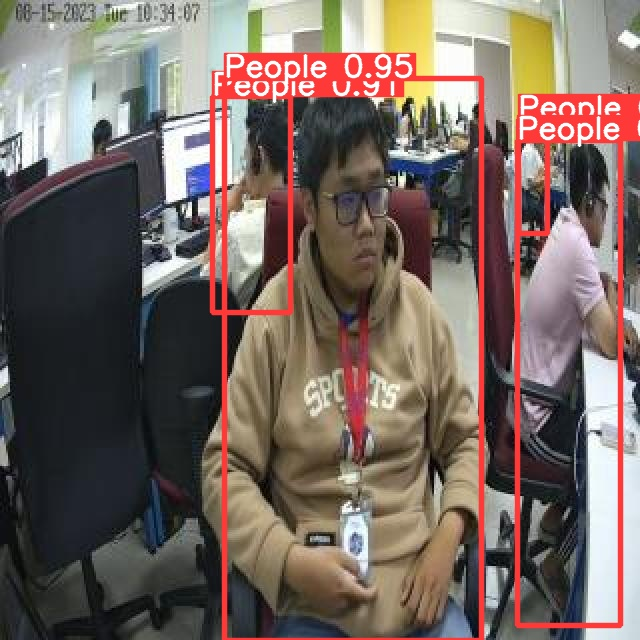

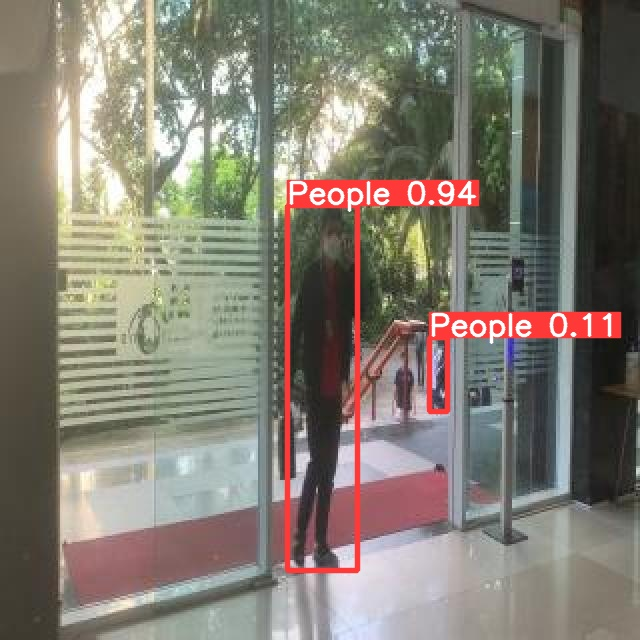

...

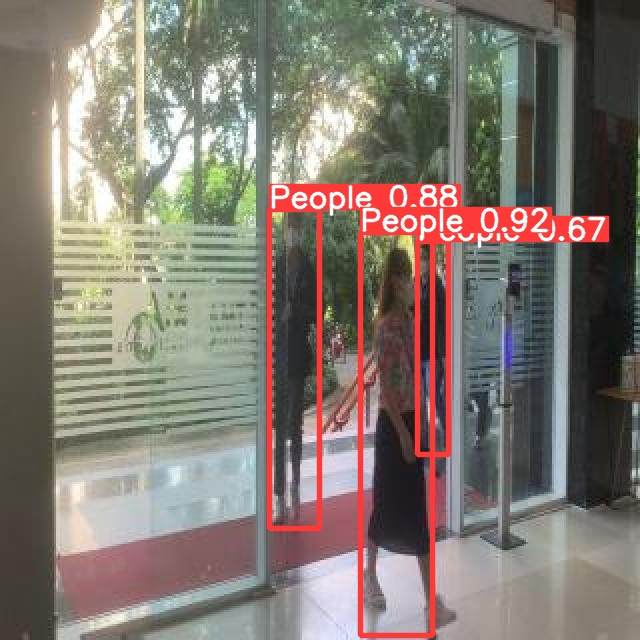

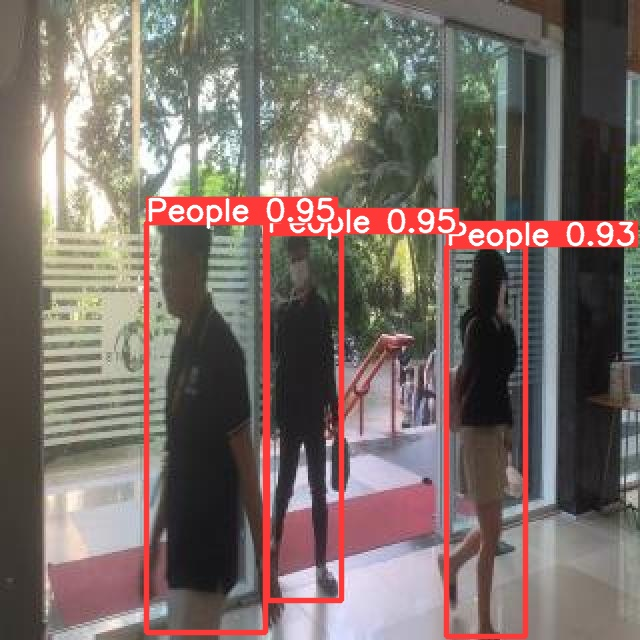

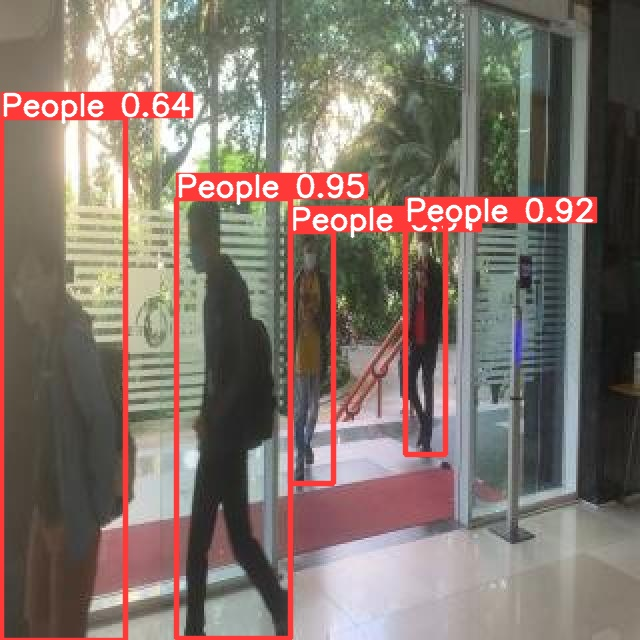

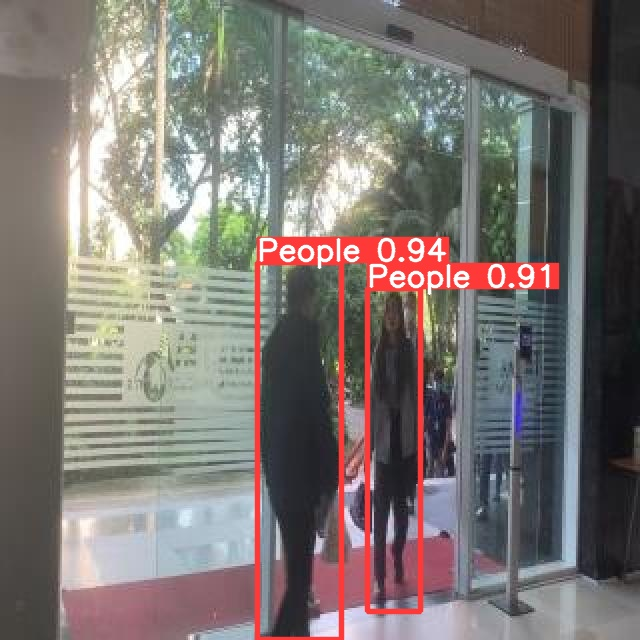

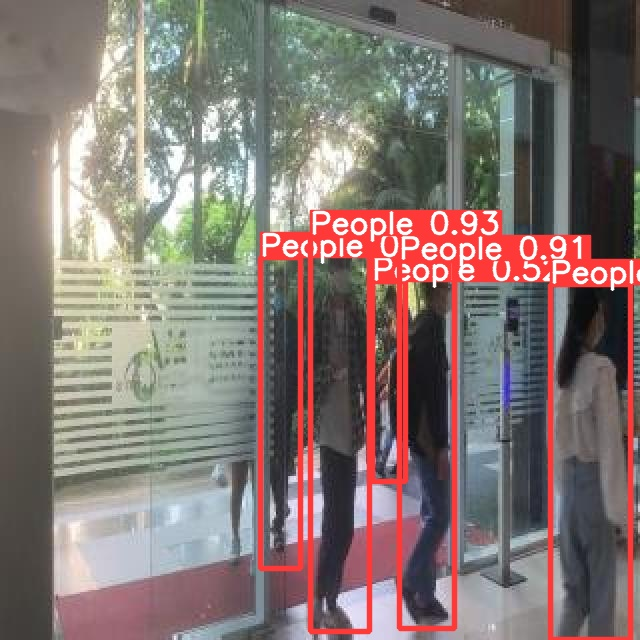

In [9]:
#display inference on ALL test images

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

In [10]:
!python val.py --weights runs/train/yolov5s_results/weights/best.pt --data /content/datasets/deteksi-kursi-8/data.yaml --img 416 --iou 0.65 --half

Traceback (most recent call last):
  File "/content/yolov5/val.py", line 410, in <module>
    opt = parse_opt()
  File "/content/yolov5/val.py", line 367, in parse_opt
    opt.data = check_yaml(opt.data)  # check YAML
  File "/content/yolov5/utils/general.py", line 442, in check_yaml
    return check_file(file, suffix)
  File "/content/yolov5/utils/general.py", line 468, in check_file
    assert len(files), f'File not found: {file}'  # assert file was found
AssertionError: File not found: /content/datasets/deteksi-kursi-8/data.yaml


In [11]:
!ls runs/train/yolov5s_results

confusion_matrix.png				   PR_curve.png		  val_batch0_pred.jpg
events.out.tfevents.1703185443.7b79597cccde.790.0  R_curve.png		  val_batch1_labels.jpg
F1_curve.png					   results.csv		  val_batch1_pred.jpg
hyp.yaml					   results.png		  val_batch2_labels.jpg
labels_correlogram.jpg				   train_batch0.jpg	  val_batch2_pred.jpg
labels.jpg					   train_batch1.jpg	  weights
opt.yaml					   train_batch2.jpg
P_curve.png					   val_batch0_labels.jpg


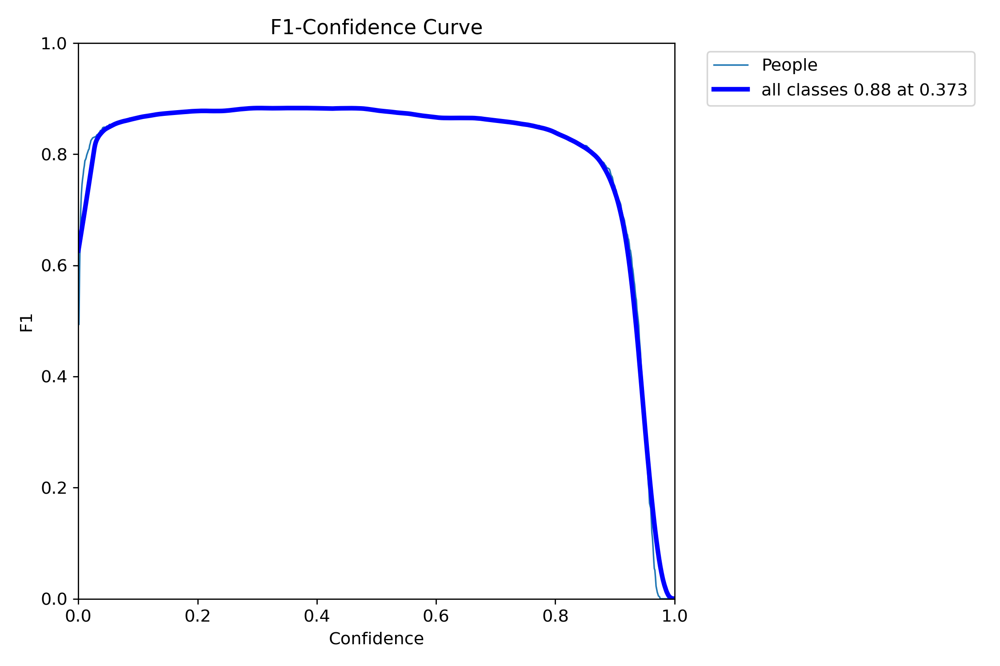

In [12]:
from utils.plots import plot_results
Image(filename='runs/train/yolov5s_results/F1_curve.png', width=1000)

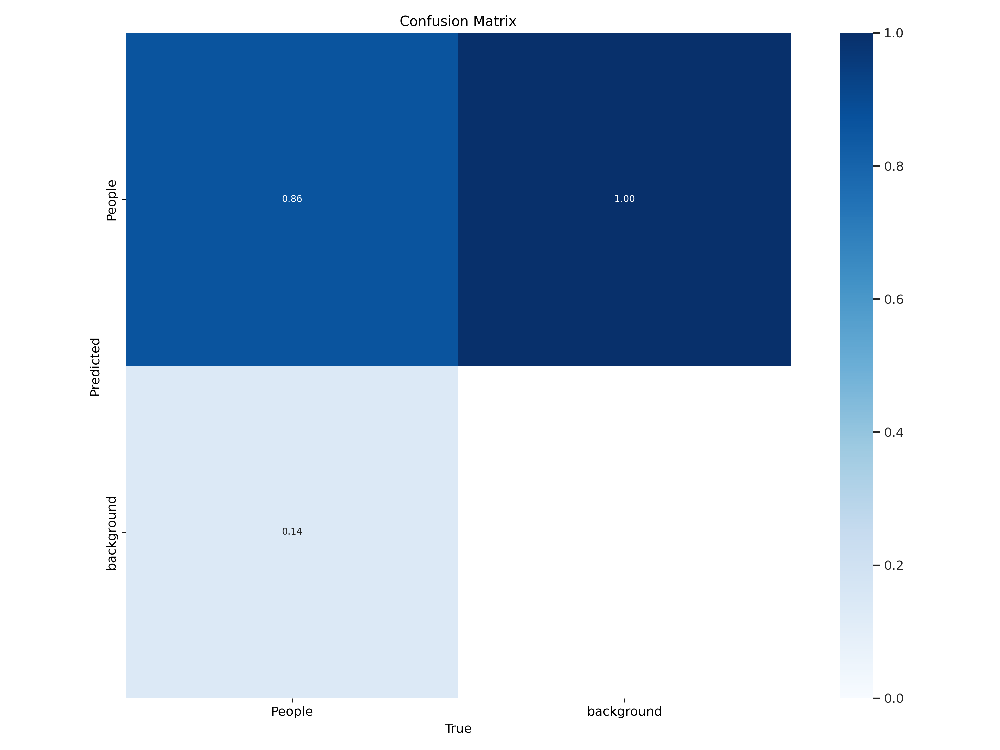

In [13]:
from utils.plots import plot_results
Image(filename='runs/train/yolov5s_results/confusion_matrix.png', width=1000)

In [14]:
!python detect.py --weights runs/train/yolov5s_results/weights/best.pt --img 416 --conf 0.1 --source /content/T.png

detect: weights=['runs/train/yolov5s_results/weights/best.pt'], source=/content/T.png, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-253-g63555c8 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
Traceback (most recent call last):
  File "/content/yolov5/detect.py", line 285, in <module>
    main(opt)
  File "/content/yolov5/detect.py", line 280, in main
    run(**vars(opt))
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/_contextlib.py", line 115, in decorate_context
    return func(*args, **kwargs)
  

In [15]:
#download
fro google.colab import files
files.download('/content/yolov5/runs/train/yolov5s_results/P_curve.png')

SyntaxError: ignored

In [ ]:
#download
fro google.colab import files
files.download('/content/yolov5/runs/train/yolov5s_results/PR_curve.png')

In [ ]:
#download
from google.colab import files
files.download('/content/yolov5/runs/train/yolov5s_results/confusion_matrix.png')

In [ ]:
#download
from google.colab import files
files.download('/content/yolov5/runs/train/yolov5s_results/R_curve.png')

In [ ]:
#download
from google.colab import files
files.download('/content/yolov5/runs/train/yolov5s_results/F1_curve.png')

In [16]:
#download
from google.colab import files
files.download('/content/yolov5/runs/train/yolov5s_results/weights/best.pt')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>